In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.0/899.0 kB 13.6 MB/s eta 0:00:00a 0:00:01


In [2]:
from ultralytics import YOLO
model1 = YOLO("/kaggle/input/sportsdet/pytorch/default/2/player_detector_football.pt")
model2 = YOLO("/kaggle/input/sportsdet/pytorch/default/2/footballANDplayer.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
!pip install ensemble-boxes

In [8]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="mT57enooROcGwCX22ayO")
project = rf.workspace("nikhil-chapre-xgndf").project("detect-players-dgxz0")
version = project.version(7)
dataset = version.download("yolov11")   

loading Roboflow workspace...
loading Roboflow project...


In [6]:
data_yaml_content = """
train: /kaggle/working/Detect-Players--7/train/images
val: /kaggle/working/Detect-Players--7/valid/images
test: /kaggle/working/Detect-Players--7/test/images

nc: 2
names: ['Ball', 'Player']
"""

with open("/kaggle/working/sports_data.yaml", "w") as f:
    f.write(data_yaml_content)


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-10_jpg.rf.0955a950bbe84886790fd36798248863.jpg: 384x640 22 Players, 3 Referees, 97.5ms
Speed: 4.1ms preprocess, 97.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-10_jpg.rf.0955a950bbe84886790fd36798248863.jpg: 384x640 19 Players, 96.2ms
Speed: 2.9ms preprocess, 96.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


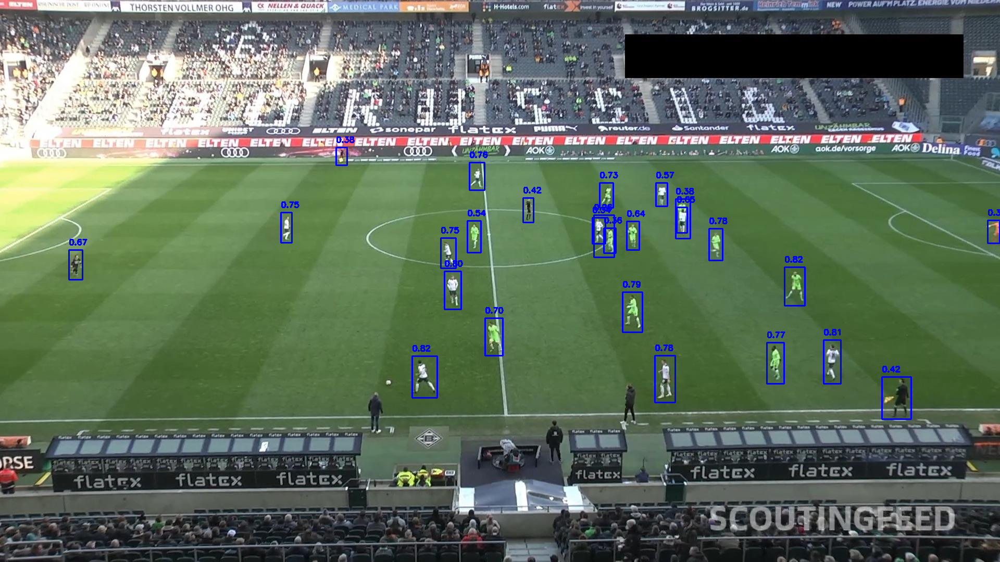

Final annotated image saved at: /kaggle/working/final_annotated_image.jpg


In [26]:
from PIL import Image
import cv2
import numpy as np
from ensemble_boxes import weighted_boxes_fusion
from IPython.display import display

# Image for inference
image_path = "/kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-10_jpg.rf.0955a950bbe84886790fd36798248863.jpg"

# Perform inference with both models
results1 = model1.predict(image_path, conf=0.25,show_labels=False,show_conf=True)
results2 = model2.predict(image_path, conf=0.25,show_labels=False,show_conf=True)

# Extract bounding boxes, scores, and class IDs from the predictions
def extract_predictions(results):
    bboxes = []
    scores = []
    classes = []

    for box in results[0].boxes:  # Assuming one image in batch
        x1, y1, x2, y2 = box.xyxy[0].tolist()  # Convert box format to [x1, y1, x2, y2]
        score = box.conf.item()  # Convert score to a scalar
        cls = int(box.cls.item())  # Convert class to an integer
        bboxes.append([x1, y1, x2, y2])
        scores.append(score)
        classes.append(cls)

    return np.array(bboxes), np.array(scores), np.array(classes)

# Extract predictions for both models
bboxes1, scores1, classes1 = extract_predictions(results1)
bboxes2, scores2, classes2 = extract_predictions(results2)

# Normalize bounding box coordinates to [0, 1]
image = cv2.imread(image_path)
image_width, image_height = image.shape[1], image.shape[0]
normalize = lambda bboxes: np.array([[x1 / image_width, y1 / image_height, x2 / image_width, y2 / image_height] for x1, y1, x2, y2 in bboxes])
bboxes1 = normalize(bboxes1)
bboxes2 = normalize(bboxes2)

# Prepare inputs for WBF
bboxes_list = [bboxes1, bboxes2]
scores_list = [scores1, scores2]
labels_list = [classes1, classes2]

# Apply Weighted Box Fusion
bboxes, scores, labels = weighted_boxes_fusion(bboxes_list, scores_list, labels_list, iou_thr=0.5, skip_box_thr=0.25)

# Rescale bounding boxes back to original image size
bboxes = [[x1 * image_width, y1 * image_height, x2 * image_width, y2 * image_height] for x1, y1, x2, y2 in bboxes]

# Define colors for annotations
color_fused = (255, 0, 0)   # Blue for fused boxes

# Annotate the image with bounding boxes
def annotate_image(image, bboxes, scores, labels, color):
    for bbox, score, label in zip(bboxes, scores, labels):
        x1, y1, x2, y2 = map(int, bbox)
        label_text = f"{score:.2f}"
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Annotate Fused results on a new image
image_fused = image.copy()
annotate_image(image_fused, bboxes, scores, labels, color_fused)

# Convert images from BGR to RGB for PIL
image_fused = cv2.cvtColor(image_fused, cv2.COLOR_BGR2RGB)

# Convert numpy array to PIL Image object
image_fused_pil = Image.fromarray(image_fused)

# Save the final annotated image
output_path = "/kaggle/working/final_annotated_image.jpg"
image_fused_pil.save(output_path)

# Display the final fused image in the notebook
display(image_fused_pil)

# Optionally print the path where the image is saved
print(f"Final annotated image saved at: {output_path}")


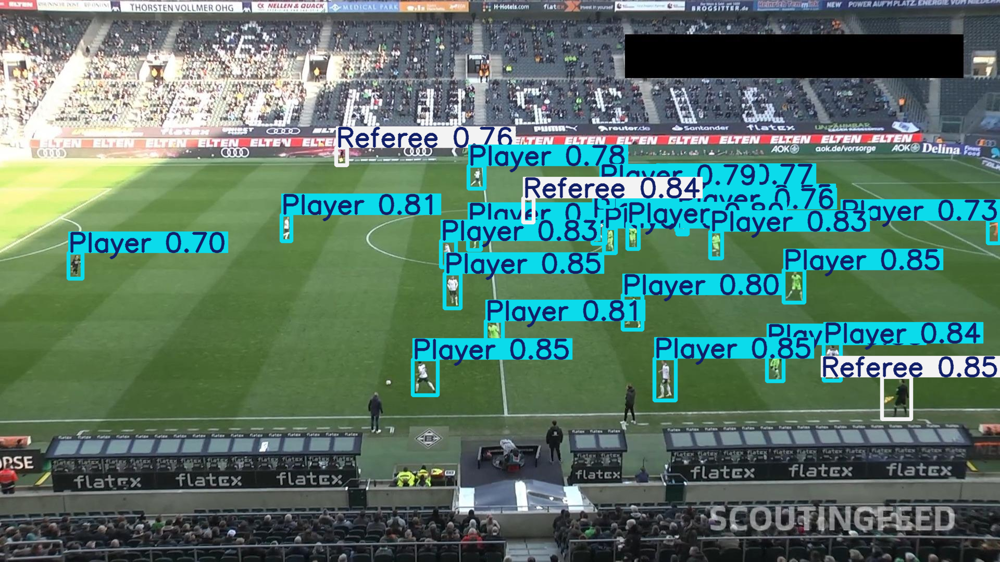

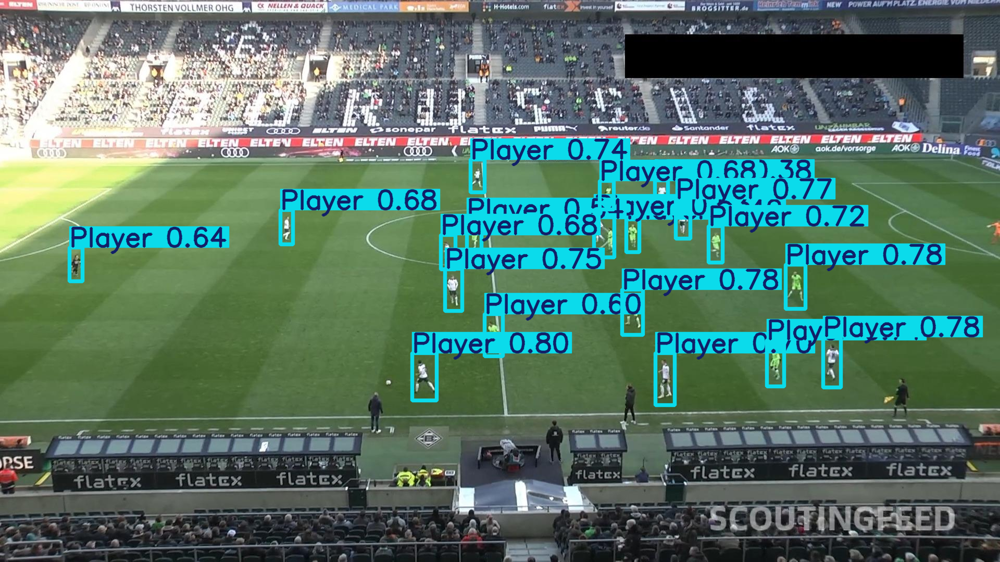

In [29]:
# Process results list
for result in results1:
    result.show()  # display to screen
    result.save(filename="result1.jpg")  # save to disk
# Process results list
for result in results2:
    result.show()  # display to screen
    result.save(filename="result2.jpg")  # save to disk

In [30]:
import os

# Path to the label directory
LABEL_DIR = "/kaggle/working/Detect-Players--7/test/labels"

# Iterate through all label files
for label_file in os.listdir(LABEL_DIR):
    file_path = os.path.join(LABEL_DIR, label_file)
    
    # Read the label file
    with open(file_path, 'r') as f:
        lines = f.readlines()
    
    # Filter out lines with class ID 2
    updated_lines = [line for line in lines if not line.startswith("2 ")]
    
    # Write back the filtered lines to the same file
    with open(file_path, 'w') as f:
        f.writelines(updated_lines)

print("Removed all entries with class ID 2.")


Removed all entries with class ID 2.


In [32]:
import os
import numpy as np
from ultralytics import YOLO
from ensemble_boxes import weighted_boxes_fusion
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import average_precision_score
import cv2


# Test directory path
test_dir = "/kaggle/working/Detect-Players--7/test/images"

# Function to extract predictions
def extract_predictions(results, ignore_class=None):
    bboxes = []
    scores = []
    classes = []

    for box in results[0].boxes:
        x1, y1, x2, y2 = box.xyxy[0].tolist()
        score = box.conf.item()
        cls = int(box.cls.item())
        
        # Skip the class we want to ignore (class 2)
        if cls == ignore_class:
            continue
        
        bboxes.append([x1, y1, x2, y2])
        scores.append(score)
        classes.append(cls)
    
    return np.array(bboxes), np.array(scores), np.array(classes)

# Function to compute IoU
def compute_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x1_p, y1_p, x2_p, y2_p = box2

    inter_area = max(0, min(x2, x2_p) - max(x1, x1_p)) * max(0, min(y2, y2_p) - max(y1, y1_p))
    area1 = (x2 - x1) * (y2 - y1)
    area2 = (x2_p - x1_p) * (y2_p - y2_p)
    iou = inter_area / float(area1 + area2 - inter_area)
    return iou

# Function to calculate Precision, Recall, F1 score
def calculate_metrics(y_true, y_pred, iou_threshold=0.5):
    tp, fp, fn = 0, 0, 0
    for true_box in y_true:
        max_iou = 0
        for pred_box in y_pred:
            iou = compute_iou(true_box[:4], pred_box[:4])
            max_iou = max(max_iou, iou)
        if max_iou > iou_threshold:
            tp += 1
        else:
            fn += 1

    for pred_box in y_pred:
        max_iou = 0
        for true_box in y_true:
            iou = compute_iou(true_box[:4], pred_box[:4])
            max_iou = max(max_iou, iou)
        if max_iou < iou_threshold:
            fp += 1

    precision = tp / (tp + fp) if tp + fp > 0 else 0
    recall = tp / (tp + fn) if tp + fn > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    return precision, recall, f1

# Function to calculate mAP@50
def calculate_map_at_50(pred_bboxes, pred_scores, gt_bboxes, iou_threshold=0.5):
    true_labels = []
    pred_labels = []

    for i, pred_bbox in enumerate(pred_bboxes):
        max_iou = 0
        for gt_bbox in gt_bboxes:
            iou = compute_iou(pred_bbox, gt_bbox)
            max_iou = max(max_iou, iou)
        if max_iou >= iou_threshold:
            true_labels.append(1)  # True positive
        else:
            true_labels.append(0)  # False positive
        pred_labels.append(pred_scores[i])  # Predicted score

    map50 = average_precision_score(true_labels, pred_labels)
    
    return map50

# Initialize lists to store metrics for each image
precisions, recalls, f1_scores, map50_scores = [], [], [], []

# Loop through each image in the test directory
for image_name in os.listdir(test_dir):
    if image_name.endswith(".jpg") or image_name.endswith(".png"):  # Handle image formats
        image_path = os.path.join(test_dir, image_name)

        # Perform inference with both models
        results1 = model1.predict(image_path, conf=0.25, show_labels=False, show_conf=True)
        results2 = model2.predict(image_path, conf=0.25, show_labels=False, show_conf=True)

        # Extract predictions for both models, filtering out class 2 for model1
        bboxes1, scores1, classes1 = extract_predictions(results1, ignore_class=2)  # Ignore class 2
        bboxes2, scores2, classes2 = extract_predictions(results2)  # No need to filter for model2

        # Normalize bounding box coordinates to [0, 1]
        image = cv2.imread(image_path)
        image_width, image_height = image.shape[1], image.shape[0]
        normalize = lambda bboxes: np.array([[x1 / image_width, y1 / image_height, x2 / image_width, y2 / image_height] for x1, y1, x2, y2 in bboxes])
        bboxes1 = normalize(bboxes1)
        bboxes2 = normalize(bboxes2)

        # Prepare inputs for Weighted Box Fusion (WBF)
        bboxes_list = [bboxes1, bboxes2]
        scores_list = [scores1, scores2]
        labels_list = [np.zeros_like(scores1), np.zeros_like(scores2)]  # Dummy labels since we don't want to display them

        # Apply WBF
        bboxes, scores, labels = weighted_boxes_fusion(bboxes_list, scores_list, labels_list, iou_thr=0.5, skip_box_thr=0.25)

        # Rescale bounding boxes back to original image size
        bboxes = [[x1 * image_width, y1 * image_height, x2 * image_width, y2 * image_height] for x1, y1, x2, y2 in bboxes]

        # Assuming ground truth annotations for this image are in the same format as predictions
        # Example: ground_truth = load_ground_truth(image_name)
        # For simplicity, we assume ground truth is available (replace this with actual data)
        ground_truth = bboxes  # Replace this with actual ground truth if available

        # Calculate Precision, Recall, F1
        precision, recall, f1 = calculate_metrics(ground_truth, bboxes)
        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1)

        # Calculate mAP50
        map50 = calculate_map_at_50(bboxes, scores, ground_truth)
        map50_scores.append(map50)

# Calculate average metrics
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)
avg_f1 = np.mean(f1_scores)
avg_map50 = np.mean(map50_scores)

# Print the results
print(f"Average Precision: {avg_precision:.2f}")
print(f"Average Recall: {avg_recall:.2f}")
print(f"Average F1 Score: {avg_f1:.2f}")
print(f"Average mAP@50: {avg_map50:.2f}")



image 1/1 /kaggle/working/Detect-Players--7/test/images/Fifa-23-2023_01_01-21_36_02_03_DVR_mp4-16_jpg.rf.85508fcdc5f8f3581c0a90542f5ef241.jpg: 384x640 17 Players, 1 Referee, 103.4ms
Speed: 3.9ms preprocess, 103.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Fifa-23-2023_01_01-21_36_02_03_DVR_mp4-16_jpg.rf.85508fcdc5f8f3581c0a90542f5ef241.jpg: 384x640 1 Ball, 12 Players, 105.0ms
Speed: 2.5ms preprocess, 105.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-14_jpg.rf.e44953327002d6191a6c8ec34fc7a084.jpg: 384x640 8 Players, 2 Referees, 110.6ms
Speed: 1.4ms preprocess, 110.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-14_jpg.rf.e44953327002d6191a6c8ec34fc7a084.jpg: 384x640 6 Players, 103.3ms
Speed: 1.6ms preprocess, 103.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-54_jpg.rf.6eb67fad286e0cb708d815250a0d5f43.jpg: 384x640 20 Players, 3 Referees, 99.9ms
Speed: 2.6ms preprocess, 99.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-54_jpg.rf.6eb67fad286e0cb708d815250a0d5f43.jpg: 384x640 21 Players, 97.3ms
Speed: 2.6ms preprocess, 97.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20098_jpg.rf.186607b5e13d76d9de2c36db160eae67.jpg: 384x640 7 Players, 2 Referees, 100.2ms
Speed: 2.1ms preprocess, 100.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20098_jpg.rf.186607b5e13d76d9de2c36db160eae67.jpg: 384x640 6 Players, 100.8ms
Speed: 2.2ms preprocess, 100.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-14_jpg.rf.eabe8c8d61d1989c022dcffc174c672b.jpg: 384x640 17 Players, 1 Referee, 99.3ms
Speed: 1.4ms preprocess, 99.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-14_jpg.rf.eabe8c8d61d1989c022dcffc174c672b.jpg: 384x640 17 Players, 100.9ms
Speed: 1.6ms preprocess, 100.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LUT_clip_mp4-20_jpg.rf.54dca8c1d33eced7d3f8f7719c5c59ec.jpg: 384x640 1 Ball, 10 Players, 96.5ms
Speed: 2.5ms preprocess, 96.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LUT_clip_mp4-20_jpg.rf.54dca8c1d33eced7d3f8f7719c5c59ec.jpg: 384x640 1 Ball, 6 Players, 96.0ms
Speed: 3.0ms preprocess, 96.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-28_jpg.rf.3a4c1bc5a6b527a7c19c1908a5df73aa.jpg: 384x640 21 Players, 2 Referees, 92.4ms
Speed: 2.6ms preprocess, 92.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-28_jpg.rf.3a4c1bc5a6b527a7c19c1908a5df73aa.jpg: 384x640 19 Players, 90.4ms
Speed: 2.7ms preprocess, 90.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-27_jpg.rf.d4e805f13fb31548968c4eef4305089e.jpg: 384x640 19 Players, 2 Referees, 91.5ms
Speed: 2.6ms preprocess, 91.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-27_jpg.rf.d4e805f13fb31548968c4eef4305089e.jpg: 384x640 1 Ball, 16 Players, 97.6ms
Speed: 2.8ms preprocess, 97.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/170_jpg.rf.a408e66d69c4dec8a148dc9a4bbe77d2.jpg: 384x640 5 Players, 4 Referees, 96.7ms
Speed: 1.9ms preprocess, 96.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/170_jpg.rf.a408e66d69c4dec8a148dc9a4bbe77d2.jpg: 384x640 3 Players, 99.0ms
Speed: 2.3ms preprocess, 99.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20104_jpg.rf.272dc7848ef291697216963acd616460.jpg: 384x640 13 Players, 1 Referee, 97.6ms
Speed: 1.9ms preprocess, 97.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20104_jpg.rf.272dc7848ef291697216963acd616460.jpg: 384x640 13 Players, 95.9ms
Speed: 2.3ms preprocess, 95.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-73_jpg.rf.0ecc3166f99c80207d77ddfa63f55e75.jpg: 384x640 1 Ball, 12 Players, 103.6ms
Speed: 2.6ms preprocess, 103.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-73_jpg.rf.0ecc3166f99c80207d77ddfa63f55e75.jpg: 384x640 12 Players, 98.9ms
Speed: 2.8ms preprocess, 98.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/THE-GABI-S-GIVE-US-THE-WIN-Sevilla-v-Arsenal-1-2-Champions-League-Martinelli-Gabriel-Jesus-BgJmphxa-2c-_mp4-13_jpg.rf.bae6a067684259a1f0eb65c81002ae16.jpg: 384x640 1 Ball, 14 Players, 1 Referee, 101.4ms
Speed: 2.0ms preprocess, 101.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/THE-GABI-S-GIVE-US-THE-WIN-Sevilla-v-Arsenal-1-2-Champions-League-Martinelli-Gabriel-Jesus-BgJmphxa-2c-_mp4-13_jpg.rf.bae6a067684259a1f0eb65c81002ae16.jpg: 384x640 1 Ball, 10 Players, 99.5ms
Speed: 2.2ms preprocess, 99.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Fifa-23-2023_01_01-21_36_02_03_DVR_mp4-12_jpg.rf.64202556624cfb591e2164bd74d4414c.jpg: 384x640 11 Players, 1 Referee, 100.5ms
Speed: 2.5ms preprocess, 100.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Fifa-23-2023_01_01-21_36_02_03_DVR_mp4-12_jpg.rf.64202556624cfb591e2164bd74d4414c.jpg: 384x640 8 Players, 104.6ms
Speed: 2.5ms preprocess, 104.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/55c9d1_5_mp4-4_jpg.rf.db9a4037bb5166dd6e0f1fb35cacd3b7.jpg: 384x640 21 Players, 1 Referee, 96.3ms
Speed: 2.5ms preprocess, 96.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/55c9d1_5_mp4-4_jpg.rf.db9a4037bb5166dd6e0f1fb35cacd3b7.jpg: 384x640 23 Players, 98.1ms
Speed: 3.0ms preprocess, 98.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-26_jpg.rf.538dc3be8ff16d7fac0bf539698abb77.jpg: 384x640 21 Players, 2 Referees, 92.8ms
Speed: 2.5ms preprocess, 92.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-26_jpg.rf.538dc3be8ff16d7fac0bf539698abb77.jpg: 384x640 17 Players, 92.1ms
Speed: 2.6ms preprocess, 92.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/UEL-Highlights-Brighton-2-Ajax-0-LJEqXmQmUk-_mp4-12_jpg.rf.c52ef776ef9d180ee18a578456f8942e.jpg: 384x640 1 Ball, 14 Players, 90.7ms
Speed: 2.2ms preprocess, 90.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/UEL-Highlights-Brighton-2-Ajax-0-LJEqXmQmUk-_mp4-12_jpg.rf.c52ef776ef9d180ee18a578456f8942e.jpg: 384x640 1 Ball, 14 Players, 86.7ms
Speed: 2.0ms preprocess, 86.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


divide by zero encountered in scalar divide



image 1/1 /kaggle/working/Detect-Players--7/test/images/Kuwait-vs-India-FIFA-World-Cup-2026-AFC-Asian-Cup-2027-Joint-Qualification-Round-2-Highlights-yZHQzjyy2po-_mp4-22_jpg.rf.b69dd3c0cbfd1dbf1cf04f20cde74b84.jpg: 384x640 19 Players, 3 Referees, 91.5ms
Speed: 2.1ms preprocess, 91.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Kuwait-vs-India-FIFA-World-Cup-2026-AFC-Asian-Cup-2027-Joint-Qualification-Round-2-Highlights-yZHQzjyy2po-_mp4-22_jpg.rf.b69dd3c0cbfd1dbf1cf04f20cde74b84.jpg: 384x640 20 Players, 94.0ms
Speed: 2.0ms preprocess, 94.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-25_jpg.rf.4bd86a61d3391877faedc19e90547ec7.jpg: 384x640 1 Ball, 21 Players, 1 Referee, 90.3ms
Speed: 2.5ms preprocess, 90.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-25_jpg.rf.4bd86a61d3391877faedc19e90547ec7.jpg: 384x640 1 Ball, 19 Players, 95.7ms
Speed: 3.2ms preprocess, 95.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/40cd38_9_mp4-13_jpg.rf.0a6ddc9b6fbe47a9abd13a74a74c9840.jpg: 384x640 22 Players, 1 Referee, 95.7ms
Speed: 2.7ms preprocess, 95.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/40cd38_9_mp4-13_jpg.rf.0a6ddc9b6fbe47a9abd13a74a74c9840.jpg: 384x640 1 Ball, 18 Players, 94.2ms
Speed: 2.5ms preprocess, 94.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20149_jpg.rf.849ebdb7be12d600b81935594925d6af.jpg: 384x640 1 Ball, 1 Player, 92.9ms
Speed: 2.0ms preprocess, 92.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20149_jpg.rf.849ebdb7be12d600b81935594925d6af.jpg: 384x640 1 Ball, 1 Player, 93.4ms
Speed: 2.0ms preprocess, 93.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-19_jpg.rf.1d48d1b8a80becfe07cdd1fb54ef8264.jpg: 384x640 18 Players, 4 Referees, 94.8ms
Speed: 2.6ms preprocess, 94.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-19_jpg.rf.1d48d1b8a80becfe07cdd1fb54ef8264.jpg: 384x640 20 Players, 94.2ms
Speed: 2.7ms preprocess, 94.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-110_jpg.rf.5d375dce00771f7e3114df9a7473f316.jpg: 384x640 1 Ball, 13 Players, 2 Referees, 95.4ms
Speed: 2.6ms preprocess, 95.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-110_jpg.rf.5d375dce00771f7e3114df9a7473f316.jpg: 384x640 1 Ball, 7 Players, 100.3ms
Speed: 2.7ms preprocess, 100.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/eFootball-PES-2021-2023_07_26-16_11_17_04_DVR_mp4-30_jpg.rf.4e44fc596591519b6e7cf4bbdfc024be.jpg: 384x640 17 Players, 1 Referee, 91.5ms
Speed: 2.6ms preprocess, 91.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/eFootball-PES-2021-2023_07_26-16_11_17_04_DVR_mp4-30_jpg.rf.4e44fc596591519b6e7cf4bbdfc024be.jpg: 384x640 15 Players, 97.4ms
Speed: 2.6ms preprocess, 97.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-40_jpg.rf.5afcdac3bc820e034c2ae236cc6426a7.jpg: 384x640 1 Ball, 12 Players, 96.5ms
Speed: 2.5ms preprocess, 96.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-40_jpg.rf.5afcdac3bc820e034c2ae236cc6426a7.jpg: 384x640 12 Players, 96.4ms
Speed: 2.6ms preprocess, 96.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-47_jpg.rf.26fd5d7d77177394a1980f51152d8372.jpg: 384x640 2 Players, 1 Referee, 94.7ms
Speed: 2.4ms preprocess, 94.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-47_jpg.rf.26fd5d7d77177394a1980f51152d8372.jpg: 384x640 5 Players, 98.4ms
Speed: 3.1ms preprocess, 98.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/HIGHLIGHTS-Arsenal-vs-Sevilla-2-0-Trossard-and-Saka-score-to-sink-Sevilla-azlwZCq8myM-_mp4-3_jpg.rf.d5aa85f277f5a8cc77096d6e44bd33cb.jpg: 384x640 3 Players, 105.2ms
Speed: 2.0ms preprocess, 105.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/HIGHLIGHTS-Arsenal-vs-Sevilla-2-0-Trossard-and-Saka-score-to-sink-Sevilla-azlwZCq8myM-_mp4-3_jpg.rf.d5aa85f277f5a8cc77096d6e44bd33cb.jpg: 384x640 3 Players, 103.8ms
Speed: 2.3ms preprocess, 103.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-23_jpg.rf.60d84db67aa605a5704d1f518f529f50.jpg: 384x640 1 Ball, 14 Players, 2 Referees, 113.4ms
Speed: 2.1ms preprocess, 113.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-23_jpg.rf.60d84db67aa605a5704d1f518f529f50.jpg: 384x640 1 Ball, 14 Players, 101.7ms
Speed: 2.4ms preprocess, 101.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20113_jpg.rf.33fbeed7847575bc6e56347de2a68a67.jpg: 384x640 1 Ball, 13 Players, 2 Referees, 104.9ms
Speed: 2.8ms preprocess, 104.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20113_jpg.rf.33fbeed7847575bc6e56347de2a68a67.jpg: 384x640 1 Ball, 12 Players, 100.6ms
Speed: 2.3ms preprocess, 100.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-35_jpg.rf.c941a1047bdead07025f482cbdbcc2e1.jpg: 384x640 17 Players, 3 Referees, 100.7ms
Speed: 2.0ms preprocess, 100.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-35_jpg.rf.c941a1047bdead07025f482cbdbcc2e1.jpg: 384x640 18 Players, 107.1ms
Speed: 2.2ms preprocess, 107.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-30_jpg.rf.7748a3ffb819e8bc19b3dc18f42190e8.jpg: 384x640 16 Players, 2 Referees, 118.3ms
Speed: 1.5ms preprocess, 118.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-30_jpg.rf.7748a3ffb819e8bc19b3dc18f42190e8.jpg: 384x640 1 Ball, 15 Players, 134.0ms
Speed: 1.6ms preprocess, 134.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-6_jpg.rf.d46e8cdb2514a61b68f3590520f1d82c.jpg: 384x640 15 Players, 1 Referee, 142.3ms
Speed: 1.6ms preprocess, 142.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-6_jpg.rf.d46e8cdb2514a61b68f3590520f1d82c.jpg: 384x640 3 Players, 128.0ms
Speed: 1.6ms preprocess, 128.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-24_jpg.rf.de3f5a2397f95203f731ae274f3c7ac2.jpg: 384x640 1 Ball, 11 Players, 137.6ms
Speed: 1.8ms preprocess, 137.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-24_jpg.rf.de3f5a2397f95203f731ae274f3c7ac2.jpg: 384x640 9 Players, 117.6ms
Speed: 3.1ms preprocess, 117.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-9_jpg.rf.122343a29876c2e519b36ff5fd9a6a16.jpg: 384x640 10 Players, 122.1ms
Speed: 2.6ms preprocess, 122.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-9_jpg.rf.122343a29876c2e519b36ff5fd9a6a16.jpg: 384x640 6 Players, 114.1ms
Speed: 3.4ms preprocess, 114.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-97_jpg.rf.466ba0d7953baa7d779c0d87c3efe8bc.jpg: 384x640 1 Ball, 2 Players, 138.6ms
Speed: 3.5ms preprocess, 138.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-97_jpg.rf.466ba0d7953baa7d779c0d87c3efe8bc.jpg: 384x640 2 Players, 131.5ms
Speed: 3.4ms preprocess, 131.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-50_jpg.rf.8665088342f2bb3b2a5b9a6d8a2ef802.jpg: 384x640 1 Ball, 18 Players, 1 Referee, 143.1ms
Speed: 2.8ms preprocess, 143.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-50_jpg.rf.8665088342f2bb3b2a5b9a6d8a2ef802.jpg: 384x640 1 Ball, 18 Players, 134.3ms
Speed: 4.2ms preprocess, 134.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/AS-MONACO-STADE-BRESTOIS-29-2-0-Highlights-ASM-SB29-2023-2024-tZ7XLlGL9CI-_mp4-34_jpg.rf.b0cd2c28e2758cbd32f748b203cf71d8.jpg: 384x640 1 Player, 1 Referee, 124.1ms
Speed: 3.6ms preprocess, 124.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/AS-MONACO-STADE-BRESTOIS-29-2-0-Highlights-ASM-SB29-2023-2024-tZ7XLlGL9CI-_mp4-34_jpg.rf.b0cd2c28e2758cbd32f748b203cf71d8.jpg: 384x640 3 Players, 138.6ms
Speed: 4.9ms preprocess, 138.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Serbia-U21-0-3-England-U21-McAtee-Brace-Elliott-Strike-Seal-Away-Win-Highlights-Oznu1qu1QPo-_mp4-33_jpg.rf.72248bcbe9db213499c1c169b0250aa2.jpg: 384x640 18 Players, 2 Referees, 130.0ms
Speed: 2.2ms preprocess, 130.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Serbia-U21-0-3-England-U21-McAtee-Brace-Elliott-Strike-Seal-Away-Win-Highlights-Oznu1qu1QPo-_mp4-33_jpg.rf.72248bcbe9db213499c1c169b0250aa2.jpg: 384x640 16 Players, 129.5ms
Speed: 2.3ms preprocess, 129.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20029_jpg.rf.36c8d321836919ea0e0f393e71e29f40.jpg: 384x640 1 Ball, 10 Players, 145.7ms
Speed: 2.2ms preprocess, 145.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20029_jpg.rf.36c8d321836919ea0e0f393e71e29f40.jpg: 384x640 1 Ball, 9 Players, 109.4ms
Speed: 2.9ms preprocess, 109.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-50_jpg.rf.280a97a5f7e9fd3e8d58ad9ada7a223a.jpg: 384x640 1 Ball, 18 Players, 2 Referees, 105.0ms
Speed: 3.0ms preprocess, 105.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-50_jpg.rf.280a97a5f7e9fd3e8d58ad9ada7a223a.jpg: 384x640 1 Ball, 17 Players, 111.9ms
Speed: 2.6ms preprocess, 111.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Newcastle-United-4-Chelsea-1-Premier-League-Highlights-sbycya3wXcs-_mp4-20_jpg.rf.32eb3e16a6e18d74cc6acb74b1bdfe6c.jpg: 384x640 18 Players, 1 Referee, 97.2ms
Speed: 2.4ms preprocess, 97.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Newcastle-United-4-Chelsea-1-Premier-League-Highlights-sbycya3wXcs-_mp4-20_jpg.rf.32eb3e16a6e18d74cc6acb74b1bdfe6c.jpg: 384x640 17 Players, 101.1ms
Speed: 2.0ms preprocess, 101.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Serbia-U21-0-3-England-U21-McAtee-Brace-Elliott-Strike-Seal-Away-Win-Highlights-Oznu1qu1QPo-_mp4-38_jpg.rf.aac2764ea4ec530663139d95c04e7d9b.jpg: 384x640 1 Ball, 13 Players, 1 Referee, 98.7ms
Speed: 3.1ms preprocess, 98.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Serbia-U21-0-3-England-U21-McAtee-Brace-Elliott-Strike-Seal-Away-Win-Highlights-Oznu1qu1QPo-_mp4-38_jpg.rf.aac2764ea4ec530663139d95c04e7d9b.jpg: 384x640 1 Ball, 13 Players, 91.8ms
Speed: 1.9ms preprocess, 91.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/UEL-Highlights-Brighton-2-Ajax-0-LJEqXmQmUk-_mp4-32_jpg.rf.37ca89c0d3767939d3874711df24bb38.jpg: 384x640 2 Balls, 5 Players, 94.3ms
Speed: 2.1ms preprocess, 94.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/UEL-Highlights-Brighton-2-Ajax-0-LJEqXmQmUk-_mp4-32_jpg.rf.37ca89c0d3767939d3874711df24bb38.jpg: 384x640 (no detections), 92.1ms
Speed: 2.3ms preprocess, 92.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/0a2d9b_1_mp4-9_jpg.rf.9423ddc8bc23d616f4dc7a5424066556.jpg: 384x640 19 Players, 3 Referees, 91.2ms
Speed: 2.6ms preprocess, 91.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/0a2d9b_1_mp4-9_jpg.rf.9423ddc8bc23d616f4dc7a5424066556.jpg: 384x640 18 Players, 98.0ms
Speed: 2.6ms preprocess, 98.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-83_jpg.rf.ed7dc693f3d25636cc507db5e58b3122.jpg: 384x640 20 Players, 3 Referees, 108.3ms
Speed: 3.0ms preprocess, 108.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-83_jpg.rf.ed7dc693f3d25636cc507db5e58b3122.jpg: 384x640 18 Players, 112.5ms
Speed: 3.1ms preprocess, 112.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-79_jpg.rf.bd647fc1146a099a5d86f8e12bdfa9d4.jpg: 384x640 17 Players, 1 Referee, 123.9ms
Speed: 3.0ms preprocess, 123.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-79_jpg.rf.bd647fc1146a099a5d86f8e12bdfa9d4.jpg: 384x640 1 Ball, 20 Players, 105.0ms
Speed: 3.1ms preprocess, 105.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-66_jpg.rf.7a12d22d3919b2487a10f4d4e1d89216.jpg: 384x640 18 Players, 2 Referees, 131.3ms
Speed: 2.5ms preprocess, 131.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-66_jpg.rf.7a12d22d3919b2487a10f4d4e1d89216.jpg: 384x640 13 Players, 115.1ms
Speed: 3.3ms preprocess, 115.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-67_jpg.rf.b225a3de66c9a3489ebfc718e0a5942b.jpg: 384x640 1 Ball, 20 Players, 2 Referees, 117.3ms
Speed: 2.7ms preprocess, 117.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-67_jpg.rf.b225a3de66c9a3489ebfc718e0a5942b.jpg: 384x640 1 Ball, 18 Players, 121.7ms
Speed: 2.4ms preprocess, 121.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/158_jpg.rf.dc4830473c654a1f1a1c5df4e3aeaafc.jpg: 384x640 1 Ball, 15 Players, 1 Referee, 103.3ms
Speed: 2.3ms preprocess, 103.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/158_jpg.rf.dc4830473c654a1f1a1c5df4e3aeaafc.jpg: 384x640 1 Ball, 10 Players, 98.7ms
Speed: 2.0ms preprocess, 98.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-42_jpg.rf.55ad8d92fbbe1f6c249f70da48252367.jpg: 384x640 1 Ball, 15 Players, 1 Referee, 102.2ms
Speed: 2.8ms preprocess, 102.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-42_jpg.rf.55ad8d92fbbe1f6c249f70da48252367.jpg: 384x640 1 Ball, 14 Players, 107.1ms
Speed: 2.8ms preprocess, 107.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20143_jpg.rf.0229e3c32129f20740f4f506f8804bd4.jpg: 384x640 1 Ball, 12 Players, 2 Referees, 105.6ms
Speed: 2.1ms preprocess, 105.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20143_jpg.rf.0229e3c32129f20740f4f506f8804bd4.jpg: 384x640 1 Ball, 10 Players, 102.8ms
Speed: 2.2ms preprocess, 102.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/wolves_mp4-35_jpg.rf.60b72753e2e41236a18d80e925743af4.jpg: 384x640 1 Ball, 7 Players, 103.7ms
Speed: 2.5ms preprocess, 103.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/wolves_mp4-35_jpg.rf.60b72753e2e41236a18d80e925743af4.jpg: 384x640 1 Ball, 2 Players, 109.6ms
Speed: 3.2ms preprocess, 109.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-102_jpg.rf.52e2a7a53bebd73950580a30384e40e9.jpg: 384x640 1 Ball, 9 Players, 1 Referee, 101.2ms
Speed: 2.6ms preprocess, 101.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-102_jpg.rf.52e2a7a53bebd73950580a30384e40e9.jpg: 384x640 7 Players, 100.2ms
Speed: 2.8ms preprocess, 100.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20070_jpg.rf.117a24de8dd48b71c5649e7773de7e50.jpg: 384x640 1 Ball, 7 Players, 100.2ms
Speed: 2.0ms preprocess, 100.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20070_jpg.rf.117a24de8dd48b71c5649e7773de7e50.jpg: 384x640 7 Players, 101.4ms
Speed: 2.2ms preprocess, 101.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-36_jpg.rf.24570b6f756d27a612958cf2d2137878.jpg: 384x640 19 Players, 1 Referee, 96.1ms
Speed: 1.3ms preprocess, 96.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-36_jpg.rf.24570b6f756d27a612958cf2d2137878.jpg: 384x640 1 Ball, 21 Players, 97.0ms
Speed: 1.7ms preprocess, 97.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-18_jpg.rf.cb32018d22b579c97db066a4fe0e31de.jpg: 384x640 20 Players, 1 Referee, 102.4ms
Speed: 2.5ms preprocess, 102.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-18_jpg.rf.cb32018d22b579c97db066a4fe0e31de.jpg: 384x640 20 Players, 100.2ms
Speed: 3.1ms preprocess, 100.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-43_jpg.rf.4ea1f826cf918fb34f7297fcfd4171d4.jpg: 384x640 1 Ball, 12 Players, 1 Referee, 100.6ms
Speed: 1.3ms preprocess, 100.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-43_jpg.rf.4ea1f826cf918fb34f7297fcfd4171d4.jpg: 384x640 1 Ball, 15 Players, 108.3ms
Speed: 1.6ms preprocess, 108.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-9_jpg.rf.89d370f537662eda461d101058cec4c2.jpg: 384x640 1 Ball, 17 Players, 1 Referee, 102.9ms
Speed: 2.5ms preprocess, 102.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-9_jpg.rf.89d370f537662eda461d101058cec4c2.jpg: 384x640 4 Balls, 17 Players, 103.6ms
Speed: 2.6ms preprocess, 103.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20012_jpg.rf.ceadea7cb3f8a45f78511a2bd40ebf0e.jpg: 384x640 1 Ball, 18 Players, 2 Referees, 96.4ms
Speed: 1.9ms preprocess, 96.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20012_jpg.rf.ceadea7cb3f8a45f78511a2bd40ebf0e.jpg: 384x640 2 Balls, 22 Players, 95.2ms
Speed: 3.0ms preprocess, 95.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Serbia-U21-0-3-England-U21-McAtee-Brace-Elliott-Strike-Seal-Away-Win-Highlights-Oznu1qu1QPo-_mp4-2_jpg.rf.dd43014f6759ffa02d2dfd33f4889c99.jpg: 384x640 1 Player, 94.5ms
Speed: 2.6ms preprocess, 94.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Serbia-U21-0-3-England-U21-McAtee-Brace-Elliott-Strike-Seal-Away-Win-Highlights-Oznu1qu1QPo-_mp4-2_jpg.rf.dd43014f6759ffa02d2dfd33f4889c99.jpg: 384x640 1 Ball, 1 Player, 94.7ms
Speed: 1.9ms preprocess, 94.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LUT_clip_mp4-46_jpg.rf.2d1418a87300b1c52a88a284826c0beb.jpg: 384x640 1 Ball, 10 Players, 1 Referee, 102.2ms
Speed: 2.8ms preprocess, 102.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LUT_clip_mp4-46_jpg.rf.2d1418a87300b1c52a88a284826c0beb.jpg: 384x640 7 Players, 95.6ms
Speed: 2.7ms preprocess, 95.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/121_jpg.rf.233e25fab814d233d07298e3fc1d8c16.jpg: 384x640 1 Ball, 14 Players, 1 Referee, 89.9ms
Speed: 2.2ms preprocess, 89.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/121_jpg.rf.233e25fab814d233d07298e3fc1d8c16.jpg: 384x640 1 Ball, 19 Players, 91.6ms
Speed: 1.9ms preprocess, 91.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-16_jpg.rf.a2217d248ef3a58fa344c3b04a245d9d.jpg: 384x640 17 Players, 2 Referees, 93.1ms
Speed: 3.5ms preprocess, 93.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-16_jpg.rf.a2217d248ef3a58fa344c3b04a245d9d.jpg: 384x640 17 Players, 103.4ms
Speed: 3.5ms preprocess, 103.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ec783a_8_mp4-7_jpg.rf.b419fd50f2c8d5a8fdd50f80d9a8f081.jpg: 384x640 24 Players, 2 Referees, 96.9ms
Speed: 2.8ms preprocess, 96.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ec783a_8_mp4-7_jpg.rf.b419fd50f2c8d5a8fdd50f80d9a8f081.jpg: 384x640 16 Players, 96.6ms
Speed: 2.5ms preprocess, 96.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-2_jpg.rf.992311fb905c1e25061f89c7919c713c.jpg: 384x640 22 Players, 2 Referees, 94.0ms
Speed: 2.5ms preprocess, 94.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-2_jpg.rf.992311fb905c1e25061f89c7919c713c.jpg: 384x640 1 Ball, 14 Players, 102.0ms
Speed: 2.9ms preprocess, 102.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LENS_mp4-50_jpg.rf.6355b05695263317efbf90ff9a4cb909.jpg: 384x640 1 Ball, 15 Players, 1 Referee, 103.6ms
Speed: 3.6ms preprocess, 103.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LENS_mp4-50_jpg.rf.6355b05695263317efbf90ff9a4cb909.jpg: 384x640 2 Balls, 14 Players, 97.4ms
Speed: 2.6ms preprocess, 97.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-13_jpg.rf.68f3e0d2d40db8c281bc0ec3aab79405.jpg: 384x640 11 Players, 99.1ms
Speed: 2.4ms preprocess, 99.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-13_jpg.rf.68f3e0d2d40db8c281bc0ec3aab79405.jpg: 384x640 11 Players, 99.0ms
Speed: 3.0ms preprocess, 99.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/FC-Bayern-is-OUT-1_-FC-Saarbrucken-vs_-FC-Bayern-Munchen-2-1-Highlights-DFB-Pokal-Round-2-bO_rYiYmRFQ-_mp4-58_jpg.rf.08fa37d664d953677df41fdce4b1cd86.jpg: 384x640 20 Players, 2 Referees, 107.6ms
Speed: 1.9ms preprocess, 107.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/FC-Bayern-is-OUT-1_-FC-Saarbrucken-vs_-FC-Bayern-Munchen-2-1-Highlights-DFB-Pokal-Round-2-bO_rYiYmRFQ-_mp4-58_jpg.rf.08fa37d664d953677df41fdce4b1cd86.jpg: 384x640 18 Players, 105.8ms
Speed: 3.2ms preprocess, 105.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-76_jpg.rf.0eb9e876c01e998bcb08215bb2972984.jpg: 384x640 15 Players, 2 Referees, 114.4ms
Speed: 13.5ms preprocess, 114.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-76_jpg.rf.0eb9e876c01e998bcb08215bb2972984.jpg: 384x640 1 Ball, 15 Players, 104.4ms
Speed: 3.1ms preprocess, 104.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-25_jpg.rf.b370ac621b6dace77560c557095b5b94.jpg: 384x640 1 Ball, 14 Players, 103.8ms
Speed: 7.2ms preprocess, 103.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-25_jpg.rf.b370ac621b6dace77560c557095b5b94.jpg: 384x640 14 Players, 109.5ms
Speed: 1.9ms preprocess, 109.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/THE-GABI-S-GIVE-US-THE-WIN-Sevilla-v-Arsenal-1-2-Champions-League-Martinelli-Gabriel-Jesus-BgJmphxa-2c-_mp4-43_jpg.rf.eeb9c71eb33574d7284e831c68139751.jpg: 384x640 3 Players, 123.8ms
Speed: 2.0ms preprocess, 123.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/THE-GABI-S-GIVE-US-THE-WIN-Sevilla-v-Arsenal-1-2-Champions-League-Martinelli-Gabriel-Jesus-BgJmphxa-2c-_mp4-43_jpg.rf.eeb9c71eb33574d7284e831c68139751.jpg: 384x640 (no detections), 107.8ms
Speed: 2.2ms preprocess, 107.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/wolves_mp4-14_jpg.rf.351a8256ce2b9a892883d09152cae27d.jpg: 384x640 1 Ball, 11 Players, 1 Referee, 97.1ms
Speed: 2.4ms preprocess, 97.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/wolves_mp4-14_jpg.rf.351a8256ce2b9a892883d09152cae27d.jpg: 384x640 1 Ball, 10 Players, 111.0ms
Speed: 3.3ms preprocess, 111.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/wolves_mp4-6_jpg.rf.ed178af7b6eb242d4d1ed25030f3ec40.jpg: 384x640 16 Players, 2 Referees, 98.8ms
Speed: 5.2ms preprocess, 98.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/wolves_mp4-6_jpg.rf.ed178af7b6eb242d4d1ed25030f3ec40.jpg: 384x640 1 Ball, 11 Players, 137.6ms
Speed: 3.0ms preprocess, 137.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/a9f16c_5_mp4-6_jpg.rf.b7bed0f0c5edf68d4c58955b00aab891.jpg: 384x640 22 Players, 3 Referees, 116.5ms
Speed: 2.6ms preprocess, 116.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/a9f16c_5_mp4-6_jpg.rf.b7bed0f0c5edf68d4c58955b00aab891.jpg: 384x640 22 Players, 191.1ms
Speed: 5.0ms preprocess, 191.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-108_jpg.rf.4628b3e5e38f2088b6ab48c6303cd31d.jpg: 384x640 1 Ball, 16 Players, 1 Referee, 98.4ms
Speed: 2.4ms preprocess, 98.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-108_jpg.rf.4628b3e5e38f2088b6ab48c6303cd31d.jpg: 384x640 1 Ball, 12 Players, 103.7ms
Speed: 3.1ms preprocess, 103.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-17_jpg.rf.fcf835b02ea8549551af53d4f5fccc1e.jpg: 384x640 15 Players, 1 Referee, 99.2ms
Speed: 2.0ms preprocess, 99.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-17_jpg.rf.fcf835b02ea8549551af53d4f5fccc1e.jpg: 384x640 1 Ball, 15 Players, 100.0ms
Speed: 2.3ms preprocess, 100.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-3_jpg.rf.0821445cc057b412c267854eed971973.jpg: 384x640 17 Players, 2 Referees, 96.9ms
Speed: 1.3ms preprocess, 96.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-3_jpg.rf.0821445cc057b412c267854eed971973.jpg: 384x640 16 Players, 100.0ms
Speed: 2.0ms preprocess, 100.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/13_jpg.rf.4bd775629bff7c7a1cf333088fbade4f.jpg: 384x640 14 Players, 2 Referees, 92.1ms
Speed: 2.0ms preprocess, 92.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/13_jpg.rf.4bd775629bff7c7a1cf333088fbade4f.jpg: 384x640 15 Players, 95.2ms
Speed: 2.0ms preprocess, 95.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/clip1_mp4-27_jpg.rf.6202699ddbda39a6fad3ab49a6c21456.jpg: 384x640 1 Ball, 3 Players, 92.0ms
Speed: 2.6ms preprocess, 92.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/clip1_mp4-27_jpg.rf.6202699ddbda39a6fad3ab49a6c21456.jpg: 384x640 2 Players, 91.2ms
Speed: 2.4ms preprocess, 91.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/AS-MONACO-STADE-BRESTOIS-29-2-0-Highlights-ASM-SB29-2023-2024-tZ7XLlGL9CI-_mp4-22_jpg.rf.97769ec6282153bffe09ca251024b911.jpg: 384x640 2 Players, 92.1ms
Speed: 2.6ms preprocess, 92.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/AS-MONACO-STADE-BRESTOIS-29-2-0-Highlights-ASM-SB29-2023-2024-tZ7XLlGL9CI-_mp4-22_jpg.rf.97769ec6282153bffe09ca251024b911.jpg: 384x640 2 Players, 100.3ms
Speed: 3.1ms preprocess, 100.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20068_jpg.rf.69ba3d13a0ac8831bf5ba01e41ebb117.jpg: 384x640 7 Players, 98.2ms
Speed: 1.9ms preprocess, 98.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20068_jpg.rf.69ba3d13a0ac8831bf5ba01e41ebb117.jpg: 384x640 7 Players, 98.6ms
Speed: 3.2ms preprocess, 98.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-2_jpg.rf.4cca683c50af14175e53a38d946d4f51.jpg: 384x640 20 Players, 2 Referees, 96.9ms
Speed: 2.5ms preprocess, 96.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-2_jpg.rf.4cca683c50af14175e53a38d946d4f51.jpg: 384x640 1 Ball, 19 Players, 95.0ms
Speed: 2.5ms preprocess, 95.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-34_jpg.rf.76e21c0c77024e502ae48585bb29c352.jpg: 384x640 1 Ball, 8 Players, 95.3ms
Speed: 3.2ms preprocess, 95.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-34_jpg.rf.76e21c0c77024e502ae48585bb29c352.jpg: 384x640 1 Ball, 5 Players, 99.9ms
Speed: 3.5ms preprocess, 99.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Kuwait-vs-India-FIFA-World-Cup-2026-AFC-Asian-Cup-2027-Joint-Qualification-Round-2-Highlights-yZHQzjyy2po-_mp4-0_jpg.rf.8b746da883aa30475701806ec9ac27ae.jpg: 384x640 19 Players, 1 Referee, 92.6ms
Speed: 2.3ms preprocess, 92.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Kuwait-vs-India-FIFA-World-Cup-2026-AFC-Asian-Cup-2027-Joint-Qualification-Round-2-Highlights-yZHQzjyy2po-_mp4-0_jpg.rf.8b746da883aa30475701806ec9ac27ae.jpg: 384x640 17 Players, 93.4ms
Speed: 1.9ms preprocess, 93.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-25_jpg.rf.5dd3afc53072512d962741bd36e491c9.jpg: 384x640 20 Players, 2 Referees, 98.7ms
Speed: 2.6ms preprocess, 98.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-25_jpg.rf.5dd3afc53072512d962741bd36e491c9.jpg: 384x640 20 Players, 95.2ms
Speed: 2.3ms preprocess, 95.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/HIGHLIGHTS-Arsenal-vs-Sevilla-2-0-Trossard-and-Saka-score-to-sink-Sevilla-azlwZCq8myM-_mp4-37_jpg.rf.9e9282dc67b4f5f3d6e14d3a6fafde53.jpg: 384x640 1 Player, 96.3ms
Speed: 2.3ms preprocess, 96.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/HIGHLIGHTS-Arsenal-vs-Sevilla-2-0-Trossard-and-Saka-score-to-sink-Sevilla-azlwZCq8myM-_mp4-37_jpg.rf.9e9282dc67b4f5f3d6e14d3a6fafde53.jpg: 384x640 1 Player, 95.9ms
Speed: 1.9ms preprocess, 95.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-29_jpg.rf.de7748c05f1f4fa15ad647a4ea1ba369.jpg: 384x640 13 Players, 1 Referee, 97.9ms
Speed: 2.5ms preprocess, 97.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-29_jpg.rf.de7748c05f1f4fa15ad647a4ea1ba369.jpg: 384x640 12 Players, 89.4ms
Speed: 2.5ms preprocess, 89.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-58_jpg.rf.ce128550d3ab4ac2dca16975a843e59b.jpg: 384x640 11 Players, 1 Referee, 90.7ms
Speed: 2.6ms preprocess, 90.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-58_jpg.rf.ce128550d3ab4ac2dca16975a843e59b.jpg: 384x640 10 Players, 97.1ms
Speed: 3.0ms preprocess, 97.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20061_jpg.rf.992944b0a3b046eb6494e3611b59fdfb.jpg: 384x640 2 Players, 96.8ms
Speed: 1.9ms preprocess, 96.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20061_jpg.rf.992944b0a3b046eb6494e3611b59fdfb.jpg: 384x640 2 Players, 96.4ms
Speed: 2.2ms preprocess, 96.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/clip1_mp4-28_jpg.rf.5b70b77f51f5ca446ffa048a97957e62.jpg: 384x640 1 Ball, 17 Players, 1 Referee, 95.7ms
Speed: 2.4ms preprocess, 95.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/clip1_mp4-28_jpg.rf.5b70b77f51f5ca446ffa048a97957e62.jpg: 384x640 15 Players, 97.3ms
Speed: 2.8ms preprocess, 97.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-10_jpg.rf.0955a950bbe84886790fd36798248863.jpg: 384x640 22 Players, 3 Referees, 102.0ms
Speed: 3.1ms preprocess, 102.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-10_jpg.rf.0955a950bbe84886790fd36798248863.jpg: 384x640 19 Players, 104.8ms
Speed: 3.2ms preprocess, 104.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-41_jpg.rf.9ab226c8d7968f23b802bbe9fd1ab538.jpg: 384x640 1 Ball, 15 Players, 1 Referee, 93.4ms
Speed: 3.0ms preprocess, 93.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-41_jpg.rf.9ab226c8d7968f23b802bbe9fd1ab538.jpg: 384x640 1 Ball, 14 Players, 94.3ms
Speed: 2.5ms preprocess, 94.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-65_jpg.rf.11b8814f03c2574814ae43e710f92de2.jpg: 384x640 15 Players, 1 Referee, 94.3ms
Speed: 2.5ms preprocess, 94.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-65_jpg.rf.11b8814f03c2574814ae43e710f92de2.jpg: 384x640 1 Ball, 10 Players, 92.9ms
Speed: 2.6ms preprocess, 92.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-61_jpg.rf.52b618bd8e5cdd1403a35f778fff8cbe.jpg: 384x640 18 Players, 2 Referees, 91.5ms
Speed: 2.5ms preprocess, 91.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-61_jpg.rf.52b618bd8e5cdd1403a35f778fff8cbe.jpg: 384x640 1 Ball, 15 Players, 90.2ms
Speed: 2.4ms preprocess, 90.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-56_jpg.rf.e8b1adda4f4f737931205b4b66104317.jpg: 384x640 1 Ball, 20 Players, 2 Referees, 94.3ms
Speed: 3.5ms preprocess, 94.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-56_jpg.rf.e8b1adda4f4f737931205b4b66104317.jpg: 384x640 19 Players, 104.3ms
Speed: 2.8ms preprocess, 104.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-36_jpg.rf.64c7fc1960c2d6e92ca0bf9b471d12f1.jpg: 384x640 11 Players, 103.4ms
Speed: 3.6ms preprocess, 103.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-36_jpg.rf.64c7fc1960c2d6e92ca0bf9b471d12f1.jpg: 384x640 11 Players, 107.1ms
Speed: 3.4ms preprocess, 107.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/THE-GABI-S-GIVE-US-THE-WIN-Sevilla-v-Arsenal-1-2-Champions-League-Martinelli-Gabriel-Jesus-BgJmphxa-2c-_mp4-33_jpg.rf.bc14056425df9d5117b0dea30a7b8366.jpg: 384x640 1 Ball, 9 Players, 122.7ms
Speed: 2.2ms preprocess, 122.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/THE-GABI-S-GIVE-US-THE-WIN-Sevilla-v-Arsenal-1-2-Champions-League-Martinelli-Gabriel-Jesus-BgJmphxa-2c-_mp4-33_jpg.rf.bc14056425df9d5117b0dea30a7b8366.jpg: 384x640 2 Balls, 6 Players, 133.7ms
Speed: 2.8ms preprocess, 133.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Serbia-U21-0-3-England-U21-McAtee-Brace-Elliott-Strike-Seal-Away-Win-Highlights-Oznu1qu1QPo-_mp4-29_jpg.rf.03b1179b9f46a23c11837985882999a9.jpg: 384x640 1 Ball, 18 Players, 2 Referees, 112.1ms
Speed: 2.2ms preprocess, 112.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Serbia-U21-0-3-England-U21-McAtee-Brace-Elliott-Strike-Seal-Away-Win-Highlights-Oznu1qu1QPo-_mp4-29_jpg.rf.03b1179b9f46a23c11837985882999a9.jpg: 384x640 1 Ball, 17 Players, 106.9ms
Speed: 1.9ms preprocess, 106.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-35_jpg.rf.634ba08707f5ca0c4c2c41b56e504a7e.jpg: 384x640 1 Ball, 16 Players, 1 Referee, 107.2ms
Speed: 2.9ms preprocess, 107.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-35_jpg.rf.634ba08707f5ca0c4c2c41b56e504a7e.jpg: 384x640 1 Ball, 16 Players, 102.4ms
Speed: 2.5ms preprocess, 102.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-28_jpg.rf.3e41ec4c44e4b4a848b77de46eb5b2bb.jpg: 384x640 13 Players, 1 Referee, 103.7ms
Speed: 1.4ms preprocess, 103.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-28_jpg.rf.3e41ec4c44e4b4a848b77de46eb5b2bb.jpg: 384x640 1 Player, 98.4ms
Speed: 1.4ms preprocess, 98.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Newcastle-United-4-Chelsea-1-Premier-League-Highlights-sbycya3wXcs-_mp4-9_jpg.rf.35df57683cb6e2dfefc7f7cce9880631.jpg: 384x640 16 Players, 1 Referee, 111.3ms
Speed: 2.3ms preprocess, 111.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Newcastle-United-4-Chelsea-1-Premier-League-Highlights-sbycya3wXcs-_mp4-9_jpg.rf.35df57683cb6e2dfefc7f7cce9880631.jpg: 384x640 15 Players, 96.8ms
Speed: 2.2ms preprocess, 96.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-53_jpg.rf.f1b2cceec748e006a40dbeb3d3551c2e.jpg: 384x640 19 Players, 1 Referee, 99.2ms
Speed: 2.4ms preprocess, 99.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/TOT_VS_CITY_clip_mp4-53_jpg.rf.f1b2cceec748e006a40dbeb3d3551c2e.jpg: 384x640 18 Players, 102.8ms
Speed: 3.0ms preprocess, 102.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LENS_mp4-64_jpg.rf.b2fa347d963d04b5251853f6e7272294.jpg: 384x640 1 Ball, 13 Players, 1 Referee, 99.5ms
Speed: 2.8ms preprocess, 99.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LENS_mp4-64_jpg.rf.b2fa347d963d04b5251853f6e7272294.jpg: 384x640 1 Ball, 13 Players, 101.6ms
Speed: 3.0ms preprocess, 101.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-49_jpg.rf.b63a68846835cca55a1ae9f6494e5560.jpg: 384x640 1 Ball, 19 Players, 2 Referees, 97.4ms
Speed: 2.5ms preprocess, 97.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-49_jpg.rf.b63a68846835cca55a1ae9f6494e5560.jpg: 384x640 1 Ball, 18 Players, 96.1ms
Speed: 2.9ms preprocess, 96.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Newcastle-United-4-Chelsea-1-Premier-League-Highlights-sbycya3wXcs-_mp4-22_jpg.rf.88996bbed994e9df142da04291954949.jpg: 384x640 11 Players, 99.0ms
Speed: 1.9ms preprocess, 99.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Newcastle-United-4-Chelsea-1-Premier-League-Highlights-sbycya3wXcs-_mp4-22_jpg.rf.88996bbed994e9df142da04291954949.jpg: 384x640 12 Players, 101.2ms
Speed: 2.7ms preprocess, 101.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LENS_mp4-43_jpg.rf.18d4dea20d2ef8a956183bd0c8aa52ab.jpg: 384x640 1 Ball, 17 Players, 1 Referee, 98.7ms
Speed: 2.5ms preprocess, 98.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LENS_mp4-43_jpg.rf.18d4dea20d2ef8a956183bd0c8aa52ab.jpg: 384x640 2 Balls, 14 Players, 98.3ms
Speed: 3.0ms preprocess, 98.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/FC-Bayern-is-OUT-1_-FC-Saarbrucken-vs_-FC-Bayern-Munchen-2-1-Highlights-DFB-Pokal-Round-2-bO_rYiYmRFQ-_mp4-41_jpg.rf.bf8a294d1be1088c9d77ca618c764e69.jpg: 384x640 19 Players, 2 Referees, 100.0ms
Speed: 2.7ms preprocess, 100.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/FC-Bayern-is-OUT-1_-FC-Saarbrucken-vs_-FC-Bayern-Munchen-2-1-Highlights-DFB-Pokal-Round-2-bO_rYiYmRFQ-_mp4-41_jpg.rf.bf8a294d1be1088c9d77ca618c764e69.jpg: 384x640 1 Ball, 18 Players, 94.6ms
Speed: 2.2ms preprocess, 94.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/143_jpg.rf.190a517ed823b553c06aa38283e5d660.jpg: 384x640 1 Ball, 16 Players, 2 Referees, 101.1ms
Speed: 2.0ms preprocess, 101.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/143_jpg.rf.190a517ed823b553c06aa38283e5d660.jpg: 384x640 16 Players, 105.5ms
Speed: 2.1ms preprocess, 105.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-33_jpg.rf.b421e783368c67531cb1f33bcbf11b83.jpg: 384x640 1 Ball, 17 Players, 1 Referee, 117.4ms
Speed: 2.6ms preprocess, 117.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-33_jpg.rf.b421e783368c67531cb1f33bcbf11b83.jpg: 384x640 1 Ball, 20 Players, 106.5ms
Speed: 2.7ms preprocess, 106.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/HIGHLIGHTS-Arsenal-vs-Sevilla-2-0-Trossard-and-Saka-score-to-sink-Sevilla-azlwZCq8myM-_mp4-8_jpg.rf.8efed736c7becb53d5895d4c12ba2c3c.jpg: 384x640 18 Players, 1 Referee, 100.9ms
Speed: 1.9ms preprocess, 100.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/HIGHLIGHTS-Arsenal-vs-Sevilla-2-0-Trossard-and-Saka-score-to-sink-Sevilla-azlwZCq8myM-_mp4-8_jpg.rf.8efed736c7becb53d5895d4c12ba2c3c.jpg: 384x640 1 Ball, 18 Players, 107.8ms
Speed: 2.9ms preprocess, 107.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-61_jpg.rf.da5a07042f15a0f2081f5b9e3262bf68.jpg: 384x640 1 Ball, 17 Players, 2 Referees, 102.7ms
Speed: 2.4ms preprocess, 102.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_BRENTFORD_mp4-61_jpg.rf.da5a07042f15a0f2081f5b9e3262bf68.jpg: 384x640 2 Balls, 13 Players, 104.4ms
Speed: 2.4ms preprocess, 104.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-7_jpg.rf.827b2145de2b2a298a74b4617d6d65fd.jpg: 384x640 17 Players, 2 Referees, 101.4ms
Speed: 2.5ms preprocess, 101.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-7_jpg.rf.827b2145de2b2a298a74b4617d6d65fd.jpg: 384x640 16 Players, 97.5ms
Speed: 2.8ms preprocess, 97.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-1_jpg.rf.3ca00bd305e2ab709d01d728e6abf076.jpg: 384x640 11 Players, 1 Referee, 94.9ms
Speed: 2.5ms preprocess, 94.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_CITY_mp4-1_jpg.rf.3ca00bd305e2ab709d01d728e6abf076.jpg: 384x640 10 Players, 99.2ms
Speed: 3.7ms preprocess, 99.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20045_jpg.rf.ea864ae2e74f325d20b98503c53a031a.jpg: 384x640 1 Ball, 10 Players, 1 Referee, 91.7ms
Speed: 2.0ms preprocess, 91.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20045_jpg.rf.ea864ae2e74f325d20b98503c53a031a.jpg: 384x640 1 Ball, 9 Players, 93.2ms
Speed: 2.0ms preprocess, 93.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-66_jpg.rf.8f9ecb94e7b95b27282fd7a4d28b635e.jpg: 384x640 1 Ball, 20 Players, 2 Referees, 89.3ms
Speed: 2.5ms preprocess, 89.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/08fd33_0_mp4-66_jpg.rf.8f9ecb94e7b95b27282fd7a4d28b635e.jpg: 384x640 1 Ball, 19 Players, 91.1ms
Speed: 3.1ms preprocess, 91.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-19_jpg.rf.baa66d477a182b4af38a9ef3411e2663.jpg: 384x640 16 Players, 2 Referees, 96.4ms
Speed: 2.5ms preprocess, 96.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-19_jpg.rf.baa66d477a182b4af38a9ef3411e2663.jpg: 384x640 16 Players, 98.1ms
Speed: 3.0ms preprocess, 98.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/eFootball-PES-2021-2023_07_26-16_11_17_04_DVR_mp4-21_jpg.rf.30f336ae8e81ef6d0c5981484c3a6be4.jpg: 384x640 17 Players, 2 Referees, 98.8ms
Speed: 2.5ms preprocess, 98.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/eFootball-PES-2021-2023_07_26-16_11_17_04_DVR_mp4-21_jpg.rf.30f336ae8e81ef6d0c5981484c3a6be4.jpg: 384x640 1 Ball, 17 Players, 98.1ms
Speed: 3.8ms preprocess, 98.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LUT_clip_mp4-92_jpg.rf.add7d1ef63e1669eea08a2d06fed15d6.jpg: 384x640 1 Ball, 15 Players, 1 Referee, 97.3ms
Speed: 2.9ms preprocess, 97.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LUT_clip_mp4-92_jpg.rf.add7d1ef63e1669eea08a2d06fed15d6.jpg: 384x640 1 Ball, 13 Players, 90.6ms
Speed: 2.3ms preprocess, 90.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/eFootball-PES-2021-2023_07_26-16_11_17_04_DVR_mp4-5_jpg.rf.ac468342a1ef1bfd0cc0d75969269bd5.jpg: 384x640 1 Ball, 17 Players, 1 Referee, 92.4ms
Speed: 2.5ms preprocess, 92.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/eFootball-PES-2021-2023_07_26-16_11_17_04_DVR_mp4-5_jpg.rf.ac468342a1ef1bfd0cc0d75969269bd5.jpg: 384x640 17 Players, 95.1ms
Speed: 2.6ms preprocess, 95.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-25_jpg.rf.91fd2ddb3a28ee763b820873c31cd08a.jpg: 384x640 9 Players, 2 Referees, 87.5ms
Speed: 1.3ms preprocess, 87.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-25_jpg.rf.91fd2ddb3a28ee763b820873c31cd08a.jpg: 384x640 2 Balls, 10 Players, 89.1ms
Speed: 2.0ms preprocess, 89.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


divide by zero encountered in scalar divide



image 1/1 /kaggle/working/Detect-Players--7/test/images/20082_jpg.rf.17b9476bd8154e21e8bfafd7e745b20d.jpg: 384x640 9 Players, 2 Referees, 88.7ms
Speed: 2.0ms preprocess, 88.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20082_jpg.rf.17b9476bd8154e21e8bfafd7e745b20d.jpg: 384x640 10 Players, 90.0ms


divide by zero encountered in scalar divide


Speed: 1.9ms preprocess, 90.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20096_jpg.rf.a2ea5c5125a7afbbddacdbd299050a57.jpg: 384x640 (no detections), 89.0ms
Speed: 1.9ms preprocess, 89.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20096_jpg.rf.a2ea5c5125a7afbbddacdbd299050a57.jpg: 384x640 1 Player, 88.9ms
Speed: 1.9ms preprocess, 88.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-38_jpg.rf.b3f93851fc291e7ca2a8b2d6598440bc.jpg: 384x640 6 Players, 87.8ms
Speed: 2.0ms preprocess, 87.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-38_jpg.rf.b3f93851fc291e7ca2a8b2d6598440bc.jpg: 384x640 4 Players, 89.7ms
Speed: 1.9ms preprocess, 89.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-48_jpg.rf.42b6c14301cbeaba992abc59296173ed.jpg: 384x640 16 Players, 1 Referee, 90.2ms
Speed: 2.7ms preprocess, 90.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-48_jpg.rf.42b6c14301cbeaba992abc59296173ed.jpg: 384x640 3 Balls, 17 Players, 91.7ms
Speed: 2.4ms preprocess, 91.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/newcastle_mp4-21_jpg.rf.58023bd340f2988faf22f25163e2fb0f.jpg: 384x640 1 Ball, 11 Players, 89.9ms
Speed: 2.5ms preprocess, 89.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/newcastle_mp4-21_jpg.rf.58023bd340f2988faf22f25163e2fb0f.jpg: 384x640 1 Ball, 11 Players, 91.6ms
Speed: 2.3ms preprocess, 91.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/clip1_mp4-33_jpg.rf.a73a357f6b739c66e5479365ae9458a3.jpg: 384x640 1 Ball, 16 Players, 2 Referees, 89.7ms
Speed: 2.4ms preprocess, 89.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/clip1_mp4-33_jpg.rf.a73a357f6b739c66e5479365ae9458a3.jpg: 384x640 16 Players, 90.0ms
Speed: 2.5ms preprocess, 90.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20150_jpg.rf.e932b68997da861fa06211ef616af27c.jpg: 384x640 11 Players, 2 Referees, 89.6ms
Speed: 1.9ms preprocess, 89.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20150_jpg.rf.e932b68997da861fa06211ef616af27c.jpg: 384x640 10 Players, 89.3ms
Speed: 1.8ms preprocess, 89.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/clip1_mp4-9_jpg.rf.c4cab3d4e3949b98ffd5daca12de7b08.jpg: 384x640 11 Players, 1 Referee, 94.3ms
Speed: 2.5ms preprocess, 94.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/clip1_mp4-9_jpg.rf.c4cab3d4e3949b98ffd5daca12de7b08.jpg: 384x640 13 Players, 92.8ms
Speed: 2.4ms preprocess, 92.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/eFootball-PES-2021-2023_07_26-16_11_17_04_DVR_mp4-6_jpg.rf.dd00093a0566a29de3ef8292e4791fd7.jpg: 384x640 1 Ball, 15 Players, 1 Referee, 92.0ms
Speed: 2.6ms preprocess, 92.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/eFootball-PES-2021-2023_07_26-16_11_17_04_DVR_mp4-6_jpg.rf.dd00093a0566a29de3ef8292e4791fd7.jpg: 384x640 18 Players, 89.3ms
Speed: 2.4ms preprocess, 89.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/newcastle_mp4-27_jpg.rf.6d3f61546aa90239672f987f3af7f1fb.jpg: 384x640 1 Ball, 15 Players, 1 Referee, 89.0ms
Speed: 2.5ms preprocess, 89.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/newcastle_mp4-27_jpg.rf.6d3f61546aa90239672f987f3af7f1fb.jpg: 384x640 1 Ball, 12 Players, 98.3ms
Speed: 3.0ms preprocess, 98.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-10_jpg.rf.0fa379cbaa29cdae5f07e73b1ee2d472.jpg: 384x640 13 Players, 93.9ms
Speed: 1.3ms preprocess, 93.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/youtube-10_jpg.rf.0fa379cbaa29cdae5f07e73b1ee2d472.jpg: 384x640 13 Players, 95.3ms
Speed: 1.6ms preprocess, 95.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/20006_jpg.rf.283f52303f065409f7684253e9b2853a.jpg: 384x640 13 Players, 2 Referees, 95.4ms
Speed: 2.0ms preprocess, 95.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/20006_jpg.rf.283f52303f065409f7684253e9b2853a.jpg: 384x640 13 Players, 103.6ms
Speed: 2.1ms preprocess, 103.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-46_jpg.rf.50cc383d655a47d2b58e95b6d222af92.jpg: 384x640 6 Players, 2 Referees, 99.1ms
Speed: 2.4ms preprocess, 99.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/barca_vs_madrid_mp4-46_jpg.rf.50cc383d655a47d2b58e95b6d222af92.jpg: 384x640 7 Players, 99.9ms
Speed: 2.9ms preprocess, 99.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-22_jpg.rf.adc17ddb4a14fca0f4c497286e5b34b8.jpg: 384x640 1 Ball, 17 Players, 2 Referees, 104.8ms
Speed: 2.5ms preprocess, 104.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-22_jpg.rf.adc17ddb4a14fca0f4c497286e5b34b8.jpg: 384x640 1 Ball, 17 Players, 97.3ms
Speed: 3.1ms preprocess, 97.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/c01561_7_mp4-6_jpg.rf.c74ba9b65ac88afa00cd27720b1ee58b.jpg: 384x640 21 Players, 1 Referee, 100.5ms
Speed: 2.5ms preprocess, 100.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/c01561_7_mp4-6_jpg.rf.c74ba9b65ac88afa00cd27720b1ee58b.jpg: 384x640 20 Players, 96.3ms
Speed: 2.4ms preprocess, 96.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-23_jpg.rf.b18e654466546d6224817d0f03d5e435.jpg: 384x640 19 Players, 2 Referees, 98.6ms
Speed: 2.6ms preprocess, 98.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/NED_VS_FRA_mp4-23_jpg.rf.b18e654466546d6224817d0f03d5e435.jpg: 384x640 18 Players, 102.9ms
Speed: 2.4ms preprocess, 102.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ec783a_8_mp4-0_jpg.rf.14705d047c59cc96a5716bd5c9f2c534.jpg: 384x640 1 Ball, 20 Players, 2 Referees, 103.0ms
Speed: 2.4ms preprocess, 103.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ec783a_8_mp4-0_jpg.rf.14705d047c59cc96a5716bd5c9f2c534.jpg: 384x640 1 Ball, 15 Players, 97.9ms
Speed: 3.2ms preprocess, 97.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-17_jpg.rf.366b3e57427708ea8bdf1f59b261a269.jpg: 384x640 13 Players, 2 Referees, 96.4ms
Speed: 2.4ms preprocess, 96.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/PES_21_clip_mp4-17_jpg.rf.366b3e57427708ea8bdf1f59b261a269.jpg: 384x640 10 Players, 95.2ms
Speed: 2.6ms preprocess, 95.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LENS_mp4-28_jpg.rf.b19df3e7215c6da1403a5d0668e2ad90.jpg: 384x640 1 Ball, 11 Players, 1 Referee, 95.4ms
Speed: 2.3ms preprocess, 95.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LENS_mp4-28_jpg.rf.b19df3e7215c6da1403a5d0668e2ad90.jpg: 384x640 10 Players, 103.1ms
Speed: 2.8ms preprocess, 103.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/Kuwait-vs-India-FIFA-World-Cup-2026-AFC-Asian-Cup-2027-Joint-Qualification-Round-2-Highlights-yZHQzjyy2po-_mp4-1_jpg.rf.4ed1f629834c34566498f12c28de9ab5.jpg: 384x640 15 Players, 1 Referee, 102.8ms
Speed: 2.1ms preprocess, 102.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/Kuwait-vs-India-FIFA-World-Cup-2026-AFC-Asian-Cup-2027-Joint-Qualification-Round-2-Highlights-yZHQzjyy2po-_mp4-1_jpg.rf.4ed1f629834c34566498f12c28de9ab5.jpg: 384x640 12 Players, 110.9ms
Speed: 2.3ms preprocess, 110.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/THE-GABI-S-GIVE-US-THE-WIN-Sevilla-v-Arsenal-1-2-Champions-League-Martinelli-Gabriel-Jesus-BgJmphxa-2c-_mp4-20_jpg.rf.c790d39cc5746e5d2ae5b76db86ccd22.jpg: 384x640 1 Ball, 4 Players, 103.1ms
Speed: 3.9ms preprocess, 103.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/THE-GABI-S-GIVE-US-THE-WIN-Sevilla-v-Arsenal-1-2-Champions-League-Martinelli-Gabriel-Jesus-BgJmphxa-2c-_mp4-20_jpg.rf.c790d39cc5746e5d2ae5b76db86ccd22.jpg: 384x640 1 Ball, 4 Players, 104.6ms
Speed: 2.2ms preprocess, 104.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-57_jpg.rf.8b8b10ca994e1ecb02bda59248b342f6.jpg: 384x640 1 Player, 1 Referee, 101.5ms
Speed: 2.5ms preprocess, 101.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/2023-11-12-22-27-05_mp4-57_jpg.rf.8b8b10ca994e1ecb02bda59248b342f6.jpg: 384x640 2 Players, 101.9ms
Speed: 3.1ms preprocess, 101.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-20_jpg.rf.a6b15869cd018ead0b2ca0787192bc65.jpg: 384x640 1 Ball, 12 Players, 2 Referees, 105.5ms
Speed: 2.1ms preprocess, 105.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/VfB-Stuttgart-Borussia-Dortmund-2-1-Highlights-Matchday-11-Bundesliga-2023-24-l7OEFc8hcvQ-_mp4-20_jpg.rf.a6b15869cd018ead0b2ca0787192bc65.jpg: 384x640 1 Ball, 12 Players, 102.5ms
Speed: 2.2ms preprocess, 102.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LUT_clip_mp4-94_jpg.rf.cd8d602ab9520d605af405fb30e99a2a.jpg: 384x640 1 Ball, 15 Players, 1 Referee, 97.6ms
Speed: 2.5ms preprocess, 97.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/ARS_VS_LUT_clip_mp4-94_jpg.rf.cd8d602ab9520d605af405fb30e99a2a.jpg: 384x640 1 Ball, 11 Players, 96.3ms
Speed: 2.5ms preprocess, 96.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/FC-Bayern-is-OUT-1_-FC-Saarbrucken-vs_-FC-Bayern-Munchen-2-1-Highlights-DFB-Pokal-Round-2-bO_rYiYmRFQ-_mp4-60_jpg.rf.fd2ef82b5df870be40507fb6190b3e45.jpg: 384x640 1 Ball, 17 Players, 1 Referee, 102.9ms
Speed: 2.4ms preprocess, 102.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/FC-Bayern-is-OUT-1_-FC-Saarbrucken-vs_-FC-Bayern-Munchen-2-1-Highlights-DFB-Pokal-Round-2-bO_rYiYmRFQ-_mp4-60_jpg.rf.fd2ef82b5df870be40507fb6190b3e45.jpg: 384x640 1 Ball, 14 Players, 96.5ms
Speed: 2.2ms preprocess, 96.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/newcastle_mp4-20_jpg.rf.9eb13c0d22c96c60af440f566a676eec.jpg: 384x640 9 Players, 2 Referees, 96.9ms
Speed: 2.7ms preprocess, 96.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/newcastle_mp4-20_jpg.rf.9eb13c0d22c96c60af440f566a676eec.jpg: 384x640 10 Players, 98.6ms
Speed: 2.8ms preprocess, 98.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/Detect-Players--7/test/images/162_jpg.rf.3f245ce5d4b11cabc7151e304051455d.jpg: 384x640 1 Ball, 11 Players, 97.2ms
Speed: 2.0ms preprocess, 97.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



divide by zero encountered in scalar divide


image 1/1 /kaggle/working/Detect-Players--7/test/images/162_jpg.rf.3f245ce5d4b11cabc7151e304051455d.jpg: 384x640 5 Players, 108.8ms
Speed: 2.0ms preprocess, 108.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)
Average Precision: 1.00
Average Recall: 1.00
Average F1 Score: 1.00
Average mAP@50: 1.00


divide by zero encountered in scalar divide
